In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer,SilhouetteVisualizer
from sklearn.cluster import KMeans,DBSCAN,SpectralClustering, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt, numpy as np
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")
np.random.seed(42)

In [2]:
df = pd.read_csv('A6_marketing_campaign.csv',sep='\t')

In [ ]:
df

In [ ]:
df.info()

In [ ]:
df.describe()


In [ ]:
df[['Education','Marital_Status','Dt_Customer']].describe()

In [6]:
df = df.dropna()

In [8]:
df['ID'].nunique()

2216

so there year of birth is between 1940 and 2000

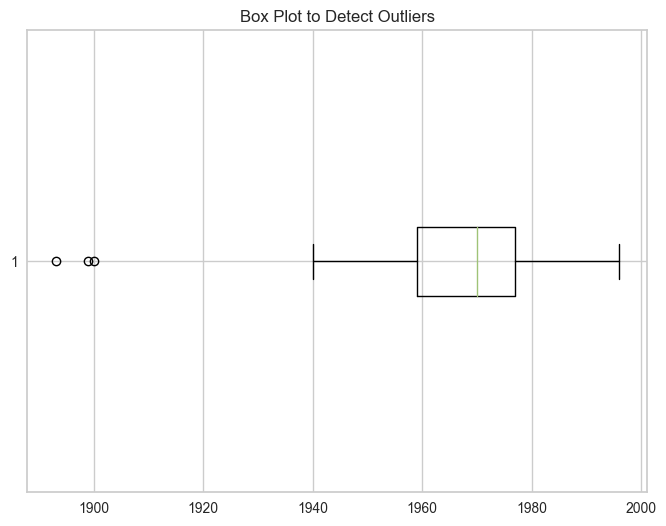

1996

In [7]:
# Assuming df['Column'] is the column you want to check for outliers
plt.figure(figsize=(8,6))
plt.boxplot(df['Year_Birth'], vert=False)  # Use vert=False for horizontal boxplot
plt.title('Box Plot to Detect Outliers')
plt.show()
max(df['Year_Birth'])

In [9]:
df['Dt_Customer']

0       04-09-2012
1       08-03-2014
2       21-08-2013
3       10-02-2014
4       19-01-2014
           ...    
2235    13-06-2013
2236    10-06-2014
2237    25-01-2014
2238    24-01-2014
2239    15-10-2012
Name: Dt_Customer, Length: 2216, dtype: object

In [10]:
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format = '%d-%m-%Y')

In [11]:
dates = df["Dt_Customer"].dt.date

# Find the newest customer's date
d1 = max(dates)

# Calculate 'Customer_For' in days
df["Customer_For"] = [(d1 - i).days for i in dates]  

In [12]:
df['Customer_For']

0       663
1       113
2       312
3       139
4       161
       ... 
2235    381
2236     19
2237    155
2238    156
2239    622
Name: Customer_For, Length: 2216, dtype: int64

In [13]:
df['Marital_Status'].value_counts()

Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [14]:
# Therefore remove row with maritial status as 'Absurd' and 'YOLO'
df = df[~df['Marital_Status'].isin(['Absurd', 'YOLO'])]


In [15]:
df['Education'].value_counts()

Education
Graduation    1115
PhD            479
Master         364
2n Cycle       200
Basic           54
Name: count, dtype: int64

In [16]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Customer_For'],
      dtype='object')

In [17]:
df['Marital_Status'].value_counts()

Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Name: count, dtype: int64

In [18]:
#Feature Engineering
#Age of customer today 
df["Age"] = 2024-df["Year_Birth"]

#Total spendings on various items
df['Spent']=df['MntWines']+df['MntFruits']+df['MntMeatProducts']+df['MntFishProducts']+df['MntSweetProducts']+df['MntGoldProds']
#Deriving living situation by marital status"Alone"
df["Living_With"]=df["Marital_Status"].replace({"Married":"Partner", "Together":"Partner", "Widow":"Alone",  "Divorced":"Alone", "Single":"Alone",})

#Feature indicating total children living in the household
df["Children"]=df["Kidhome"]+df["Teenhome"]

#Feature for total members in the householde
df["Family_Size"] = df["Living_With"].replace({"Alone": 1, "Partner":2})+ df["Children"]

#Feature pertaining parenthood
df["Is_Parent"] = np.where(df.Children> 0, 1, 0)

#Segmenting education levels in three groups
df["Education"]=df["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Postgraduate", "PhD":"Postgraduate"})

#For clarity
df=df.rename(columns={"MntWines": "Wines","MntFruits":"Fruits","MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweets","MntGoldProds":"Gold"})

#Dropping some of the redundant features
to_drop = ["Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth", "ID"]
df = df.drop(to_drop, axis=1)

In [19]:
df.describe()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Children,Family_Size,Is_Parent
count,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,...,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000
mean,52232.510850,0.442586,0.505425,49.050633,305.030741,26.324593,166.970163,37.516275,27.047468,43.822333,...,0.063743,0.013562,0.009494,0.149638,353.272152,55.188969,606.711573,0.948011,2.594485,0.714738
std,25187.455359,0.537052,0.544258,28.940794,337.611255,39.781794,224.344950,54.558673,41.092454,51.623472,...,0.244350,0.115691,0.096994,0.356797,202.376279,11.982065,603.163013,0.749196,0.905097,0.451641
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,28.000000,5.000000,0.000000,1.000000,0.000000
25%,35233.500000,0.000000,0.000000,24.000000,23.750000,1.750000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,180.000000,47.000000,68.750000,0.000000,2.000000,0.000000
50%,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,68.000000,12.000000,8.000000,24.000000,...,0.000000,0.000000,0.000000,0.000000,355.000000,54.000000,396.000000,1.000000,3.000000,1.000000
75%,68522.000000,1.000000,1.000000,74.000000,505.500000,33.000000,232.250000,50.000000,33.000000,56.000000,...,0.000000,0.000000,0.000000,0.000000,529.000000,65.000000,1047.250000,1.000000,3.000000,1.000000
max,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,...,1.000000,1.000000,1.000000,1.000000,699.000000,131.000000,2525.000000,3.000000,5.000000,1.000000


Reletive Plot Of Some Selected Features: A Data Subset


<Figure size 800x550 with 0 Axes>

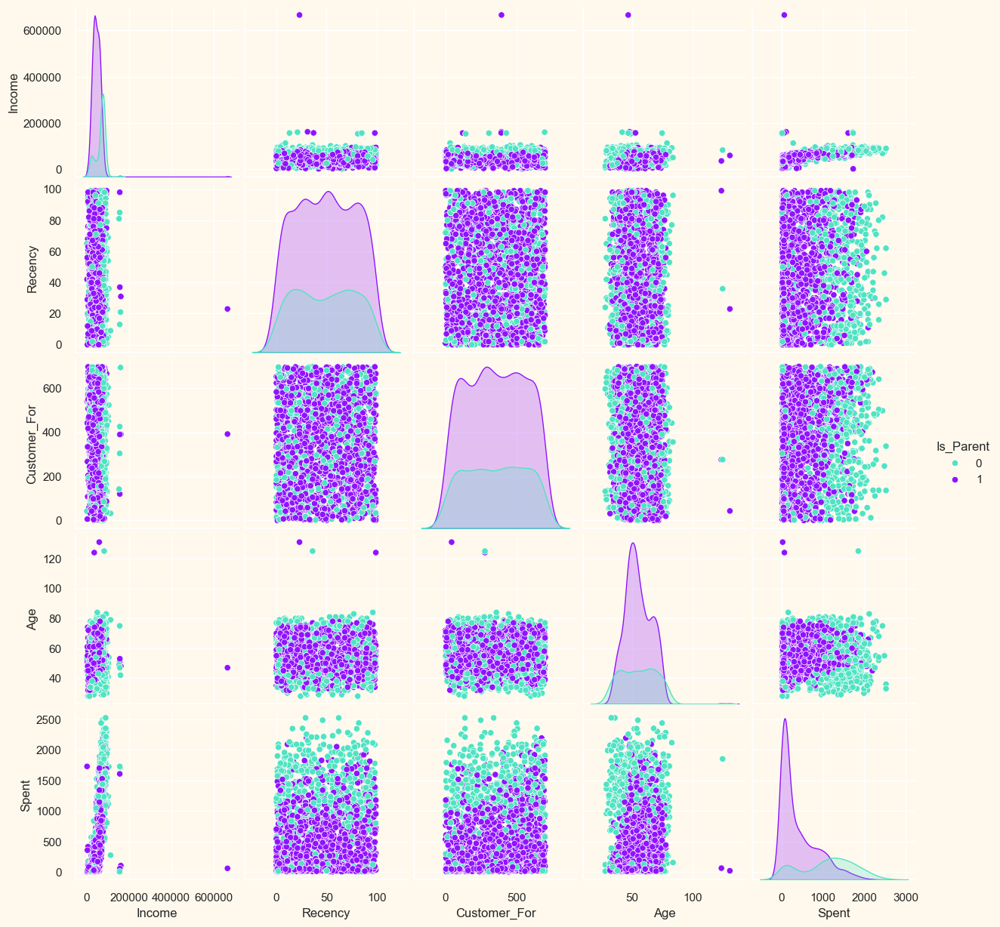

In [26]:
#To plot some selected features 
#Setting up colors prefrences
sns.set(rc={"axes.facecolor":"#FFF9ED","figure.facecolor":"#FFF9ED"})
# pallet = ["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"]
pallet2 = ["#50E3C2","#9013FE",  "#F5A623", "#D0021B", "#B8E986","#4A90E2"]

cmap = colors.ListedColormap(pallet2)
#Plotting following features
To_Plot = [ "Income", "Recency", "Customer_For", "Age", "Spent", "Is_Parent"]
print("Reletive Plot Of Some Selected Features: A Data Subset")
plt.figure()
sns.pairplot(df[To_Plot], hue= "Is_Parent",palette= pallet2)
#Taking hue 
plt.show()

In [50]:
# Clearly it can been that most features are uniformly distributed except for Income and Spent which are right skewed or positively skewed.
# It can been clearly seen from the Income and Age columns the outliers are present.

In [27]:
df.columns

Index(['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines',
       'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Customer_For',
       'Age', 'Spent', 'Living_With', 'Children', 'Family_Size', 'Is_Parent'],
      dtype='object')

Reletive Plot Of Some Selected Features: A Data Subset


<Figure size 800x550 with 0 Axes>

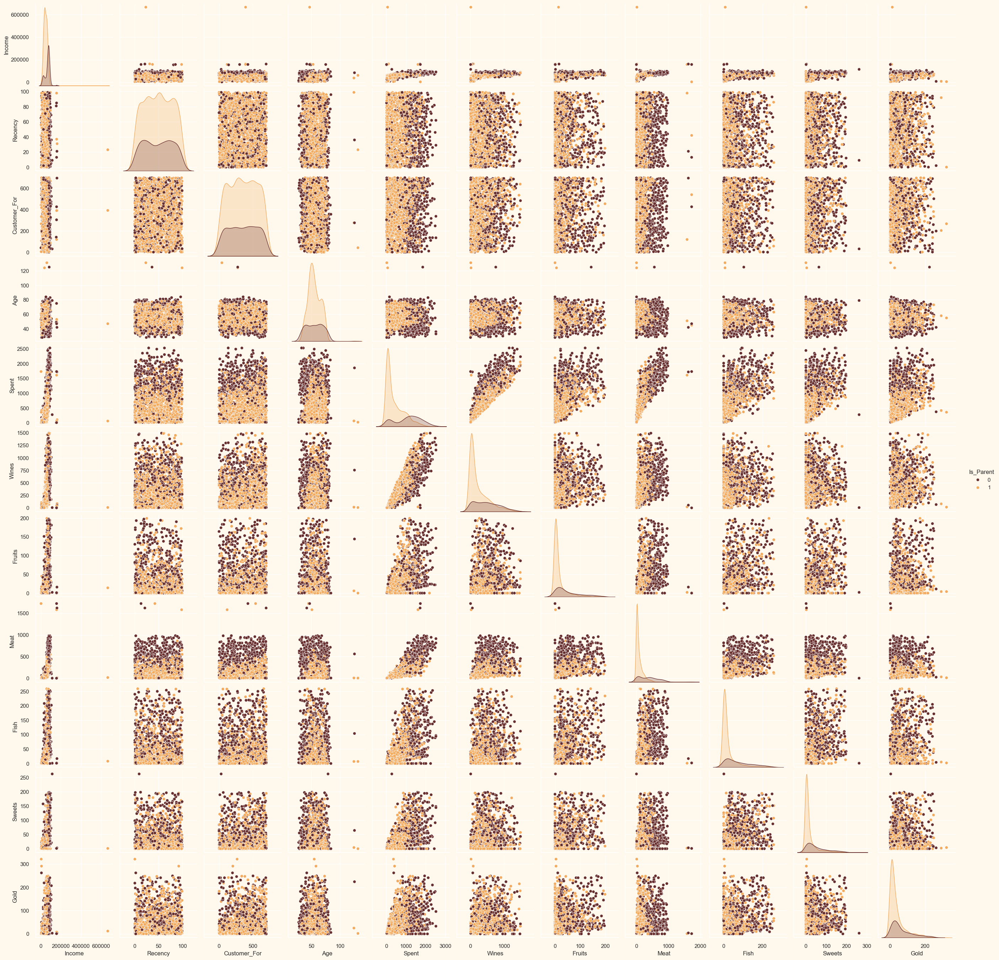

In [48]:
#To plot some selected features 
#Setting up colors prefrences
sns.set(rc={"axes.facecolor":"#FFF9ED","figure.facecolor":"#FFF9ED"})
pallet = ["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"]
cmap = colors.ListedColormap(pallet)
#Plotting following features
To_Plot = [ "Income", "Recency", "Customer_For", "Age", "Spent",'Wines',
       'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', "Is_Parent"]
print("Reletive Plot Of Some Selected Features: A Data Subset")
plt.figure()
sns.pairplot(df[To_Plot], hue= "Is_Parent",palette= (["#682F2F","#F3AB60"]))
#Taking hue 
plt.show()

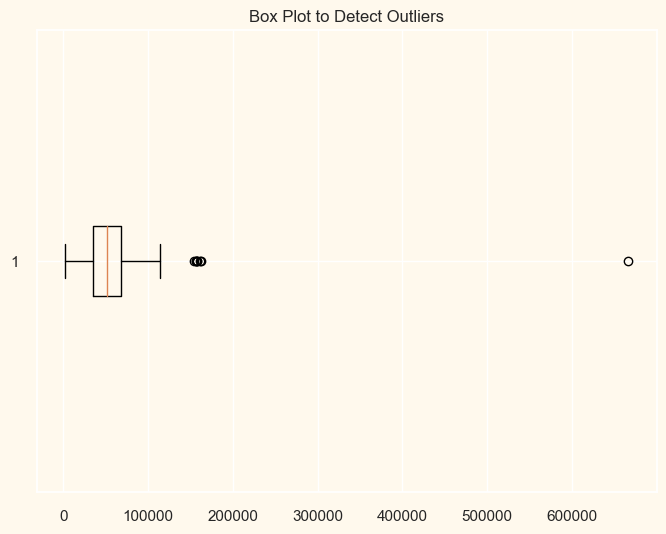

In [28]:
# Assuming df['Column'] is the column you want to check for outliers
plt.figure(figsize=(8,6))
plt.boxplot(df['Income'], vert=False)  # Use vert=False for horizontal boxplot
plt.title('Box Plot to Detect Outliers')
plt.show()

In [29]:
#Dropping the outliers by setting a cap on Age and income. 
df = df[(df["Age"]<90)]
df = df[(df["Income"]<400000)]
print("The total number of df-points after removing the outliers are:", len(df))

The total number of df-points after removing the outliers are: 2208


Reletive Plot Of Some Selected Features: A Data Subset


<Figure size 800x550 with 0 Axes>

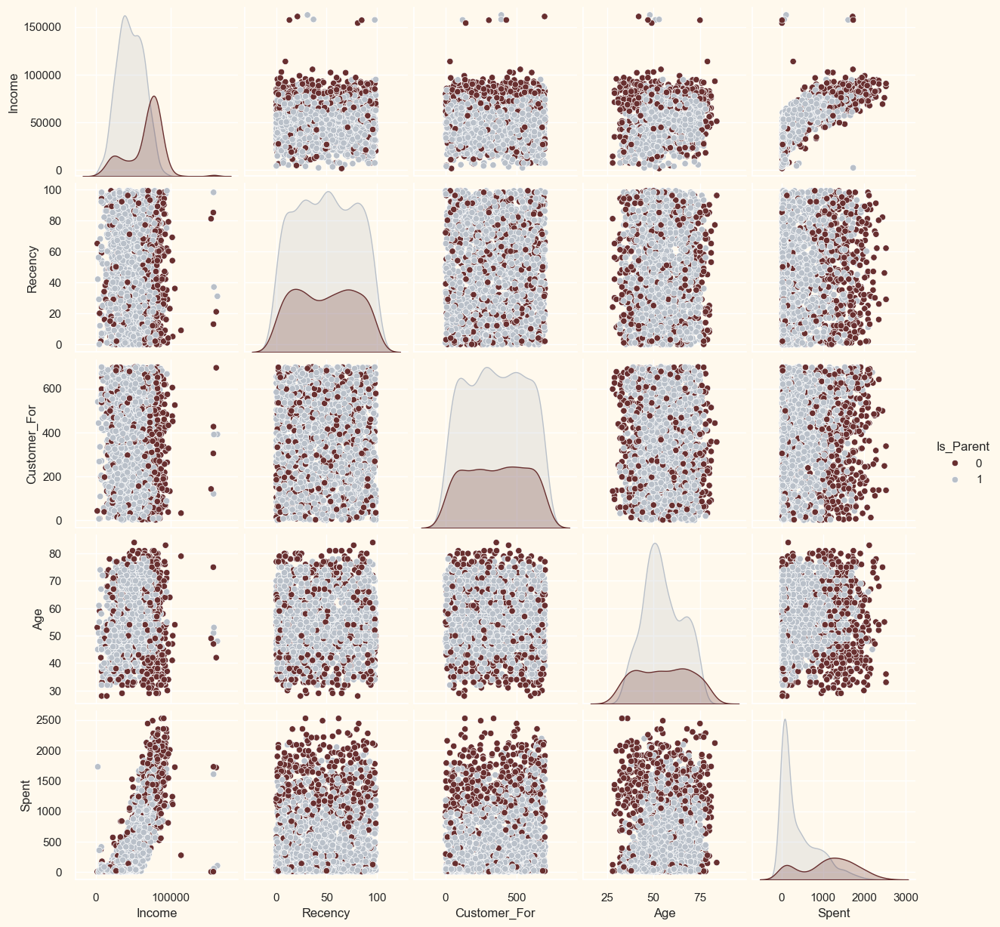

In [30]:
#To plot some selected features 
#Setting up colors prefrences
sns.set(rc={"axes.facecolor":"#FFF9ED","figure.facecolor":"#FFF9ED"})
pallet = ["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"]
cmap = colors.ListedColormap(["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"])
#Plotting following features
To_Plot = [ "Income", "Recency", "Customer_For", "Age", "Spent", "Is_Parent"]
print("Reletive Plot Of Some Selected Features: A Data Subset")
plt.figure()
sns.pairplot(df[To_Plot], hue= "Is_Parent",palette= (["#682F2F","#B9C0C9"]))
#Taking hue 
plt.show()

In [31]:
df2 = df.drop(['Education','Living_With'], axis =1)

<Axes: >

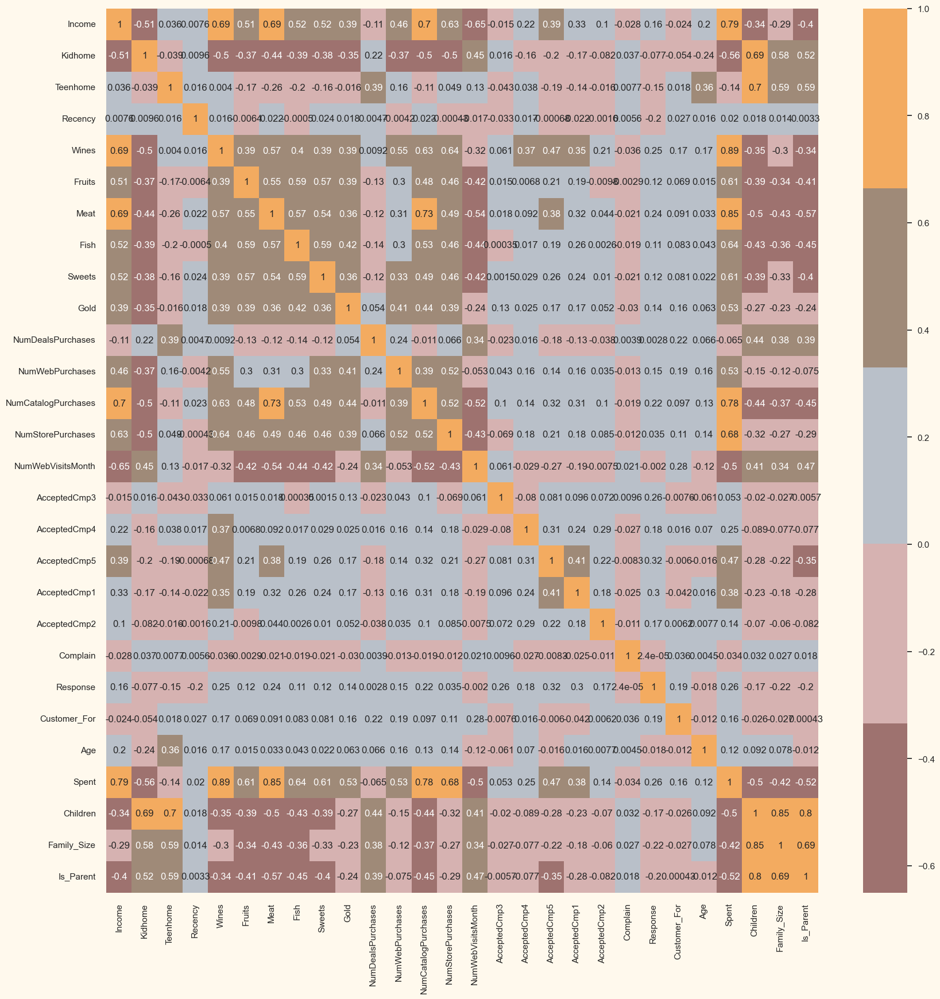

In [32]:
#correlation matrix
corrmat= df2.corr()
plt.figure(figsize=(20,20))  
sns.heatmap(corrmat,annot=True, cmap=cmap, center=0)

In [33]:
s = (df.dtypes == 'object')
object_cols = list(s[s].index)

print("Categorical variables in the dataset:", object_cols)

Categorical variables in the dataset: ['Education', 'Living_With']


In [34]:
#label encoding 
LE=LabelEncoder()
for i in object_cols:
    df[i]=df[[i]].apply(LE.fit_transform)
    
print("All features are now numerical")

All features are now numerical


In [35]:
df[['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response']].value_counts()

AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  Complain  Response
0             0             0             0             0             0         0           1589
                                                                                1            144
1             0             0             0             0             0         0             74
0             1             0             0             0             0         0             72
1             0             0             0             0             0         1             54
0             0             0             1             0             0         0             39
                            1             0             0             0         0             37
                                                                                1             20
              1             1             1             0             0         1             19
              0             0         

In [36]:
#Creating a copy of data
ds = df.copy()
# creating a subset of dataframe by dropping the features on deals accepted and promotions
cols_del = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response']
ds = ds.drop(cols_del, axis=1)
#Scaling
scaler = StandardScaler()
scaler.fit(ds)
scaled_ds = pd.DataFrame(scaler.transform(ds),columns= ds.columns )
print("All features are now scaled")

All features are now scaled


In [37]:
#Scaled data to be used for reducing the dimensionality
print("Dataframe to be used for further modelling:")
scaled_ds.head()

Dataframe to be used for further modelling:


,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,-0.892765,0.287689,-0.824004,-0.929587,0.309118,0.977018,1.553315,1.689944,2.464405,1.482521,...,2.506603,-0.555083,0.692301,1.529391,1.017915,1.676120,-1.353059,-1.265454,-1.761762,-1.582644
1,-0.892765,-0.260057,1.038228,0.907950,-0.382230,-0.871705,-0.636864,-0.717917,-0.651086,-0.634157,...,-0.570823,-1.169892,-0.133077,-1.188122,1.274437,-0.962274,-1.353059,1.403240,0.447193,0.631854
2,-0.892765,0.913505,-0.824004,-0.929587,-0.797039,0.357814,0.571511,-0.178378,1.346494,-0.147565,...,-0.228887,1.289346,-0.545767,-0.204876,0.333858,0.280592,0.739066,-1.265454,-0.657284,-1.582644
3,-0.892765,-1.174887,1.038228,-0.929587,-0.797039,-0.871705,-0.561341,-0.655491,-0.504474,-0.585498,...,-0.912759,-0.555083,0.279612,-1.059658,-1.290779,-0.919130,0.739066,0.068893,0.447193,0.631854
4,0.571741,0.294887,1.038228,-0.929587,1.553545,-0.391748,0.420464,-0.218509,0.155277,-0.001587,...,0.113050,0.059727,-0.133077,-0.950957,-1.034258,-0.306824,0.739066,0.068893,0.447193,0.631854


In [39]:
#Initiating PCA to reduce dimentions aka features to 3
pca = PCA(n_components=3)
pca.fit(scaled_ds)
PCA_ds = pd.DataFrame(pca.transform(scaled_ds), columns=(["col1","col2", "col3"]))
PCA_ds.describe().T


,count,mean,std,min,25%,50%,75%,max
col1,2208.0,-1.158494e-16,2.878156,-5.973016,-2.539136,-0.776365,2.381448,7.460913
col2,2208.0,3.861645e-17,1.710356,-4.196663,-1.325173,-0.182256,1.235963,6.171258
col3,2208.0,5.792468e-17,1.230855,-3.592229,-0.849166,-0.055321,0.866649,6.762331


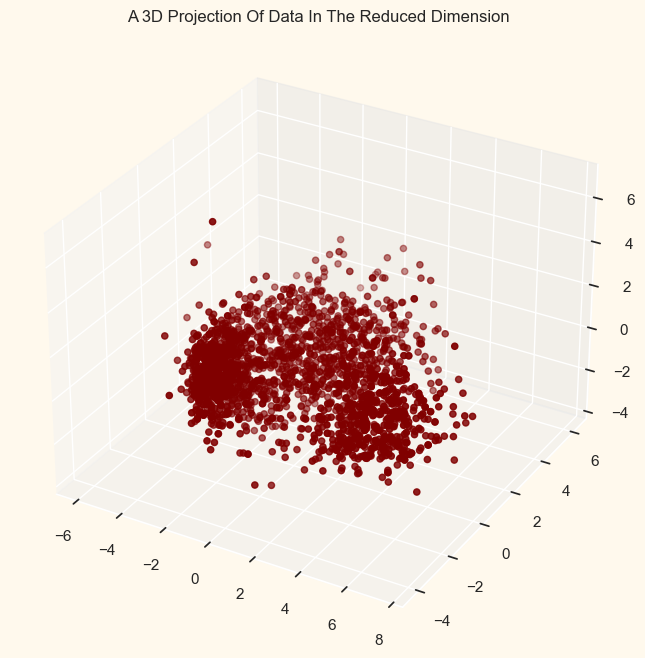

In [40]:
#A 3D Projection Of Data In The Reduced Dimension
x =PCA_ds["col1"]
y =PCA_ds["col2"]
z =PCA_ds["col3"]
#To plot
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

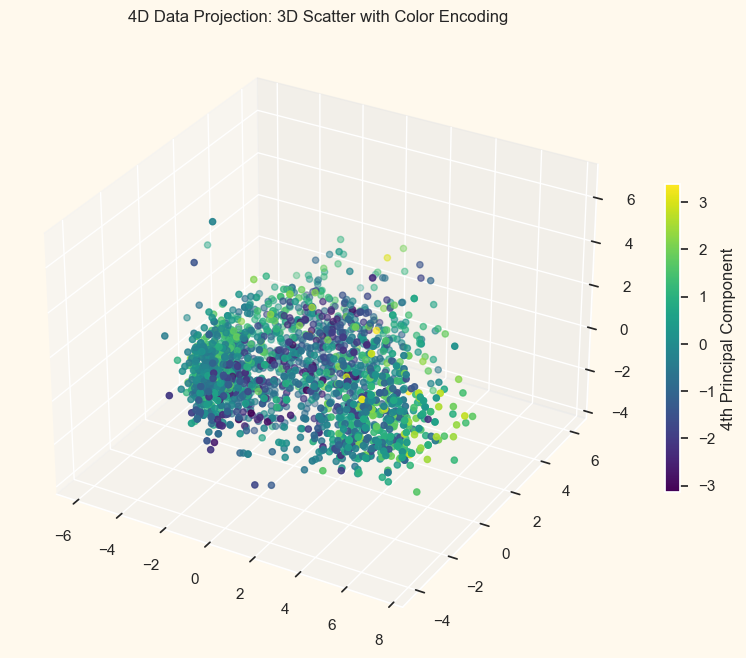

In [ ]:

# # Initiating PCA to reduce dimensions to 4
# pca = PCA(n_components=4)
# PCA_ds = pd.DataFrame(pca.fit_transform(scaled_ds), columns=["col1", "col2", "col3", "col4"])

# # Extract first 3 components for 3D plot
# x = PCA_ds["col1"]
# y = PCA_ds["col2"]
# z = PCA_ds["col3"]

# # Use the 4th component for color encoding
# color = PCA_ds["col4"]

# # To plot
# fig = plt.figure(figsize=(10, 8))
# ax = fig.add_subplot(111, projection="3d")

# # Scatter plot with color mapping based on 4th dimension
# sc = ax.scatter(x, y, z, c=color, cmap="viridis", marker="o")

# # Add colorbar to show the 4th dimension scale
# cbar = plt.colorbar(sc, ax=ax, shrink=0.5)
# cbar.set_label("4th Principal Component")

# ax.set_title("4D Data Projection: 3D Scatter with Color Encoding")
# plt.show()


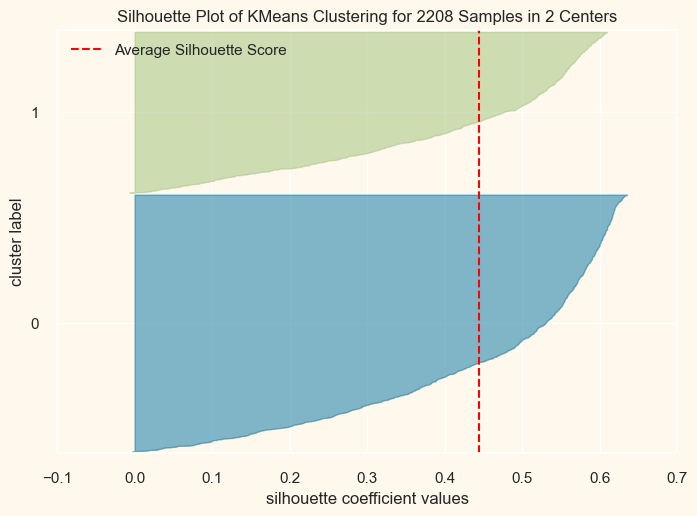

Average Silhouette Score: 0.4445416516337215


In [54]:
# Using Sihouette to find the optimal number of clusters
# Quick examination of elbow method to find numbers of clusters to make.
# print('Elbow Method to determine the number of clusters to be formed:')
# Elbow_M = KElbowVisualizer(KMeans(), k=10)
# Elbow_M.fit(PCA_ds)
# Elbow_M.show()
# Load a clustering dataset
# X, y = load_nfl()

# Specify the features to use for clustering
# features = ['Rec', 'Yds', 'TD', 'Fmb', 'Ctch_Rate']
# X = X.query('Tgt >= 20')[features]

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer

# Instantiate the KMeans model
model = KMeans(n_clusters=2)

# Fit the model
model.fit(PCA_ds)

# Use SilhouetteVisualizer to visualize the clustering
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(PCA_ds)        # Fit the data to the visualizer
visualizer.show()

# Now, compute the average silhouette score
score = silhouette_score(PCA_ds, model.labels_)

print(f"Average Silhouette Score: {score}")

In [68]:
#Initiating the Kmeans Clustering model 
KMeans_model = KMeans(n_clusters=2, random_state=42)
# fit model and predict clusters
yhat_KMeans = KMeans_model.fit_predict(PCA_ds)
# AC = AgglomerativeClustering(n_clusters=2)
# # fit model and predict clusters
# yhat_AC = AC.fit_predict(PCA_ds)
PCA_ds["Clusters"] = yhat_KMeans
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= yhat_KMeans

In [69]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering


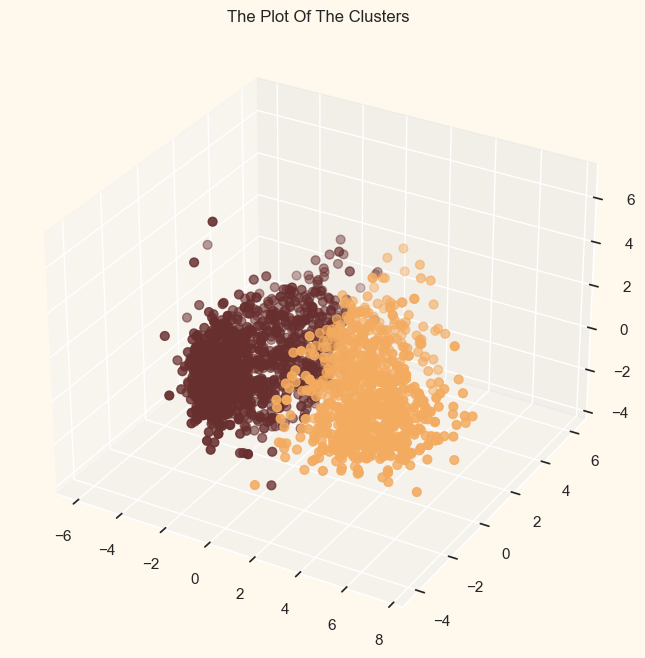

In [70]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z,s=40, c=PCA_ds["Clusters"], marker='o', cmap = cmap )
ax.set_title("The Plot Of The Clusters")
plt.show()

In [72]:
import plotly.express as px
import plotly.graph_objects as go

# Creating a Plotly 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=PCA_ds.iloc[:, 0],  # First principal component
    y=PCA_ds.iloc[:, 1],  # Second principal component
    z=PCA_ds.iloc[:, 2],  # Third principal component
    mode='markers',
    marker=dict(
        size=5,
        color=PCA_ds["Clusters"],  # Color by cluster
        colorscale='viridis',  # Change color theme if needed
        opacity=0.8
    )
)])

# Adding title and labels
fig.update_layout(
    title="Interactive 3D Cluster Plot",
    scene=dict(
        xaxis_title="PCA 1",
        yaxis_title="PCA 2",
        zaxis_title="PCA 3"
    )
)

# Show interactive plot
fig.show()


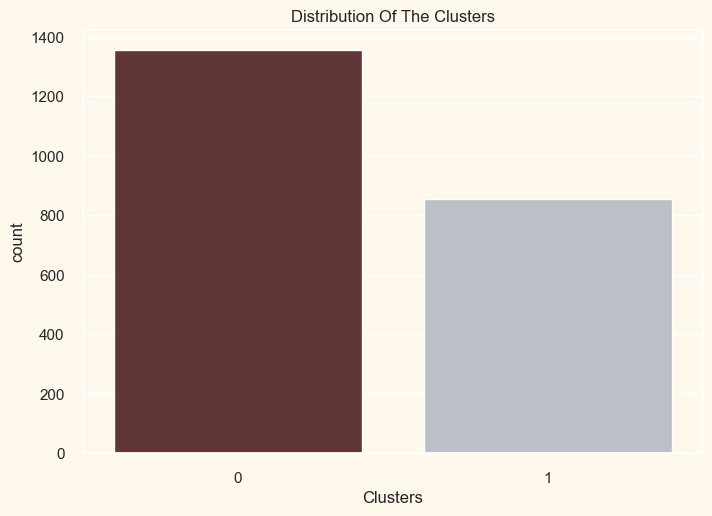

In [73]:
#Plotting countplot of clusters
pal = ["#682F2F","#B9C0C9", "#9F8A78","#F3AB60"]
pl = sns.countplot(x=df["Clusters"], palette= pal)
pl.set_title("Distribution Of The Clusters")
plt.show()

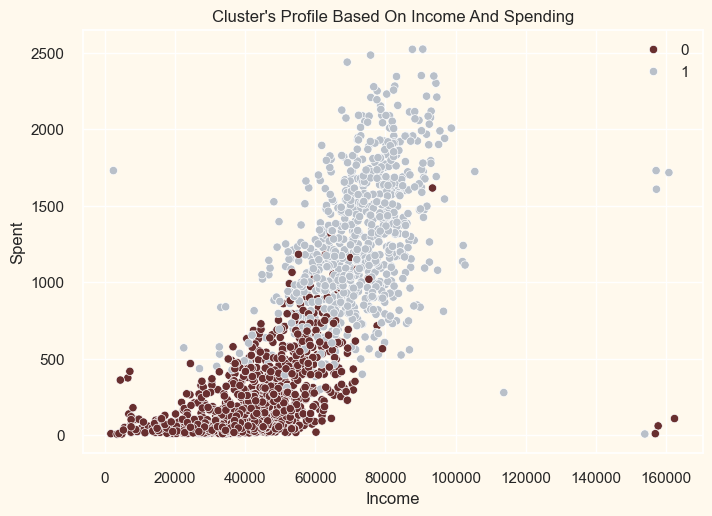

In [74]:
pl = sns.scatterplot(data = df,y=df["Spent"], x=df["Income"],hue=df["Clusters"], palette= pal)
pl.set_title("Cluster's Profile Based On Income And Spending")
plt.legend()
plt.show()

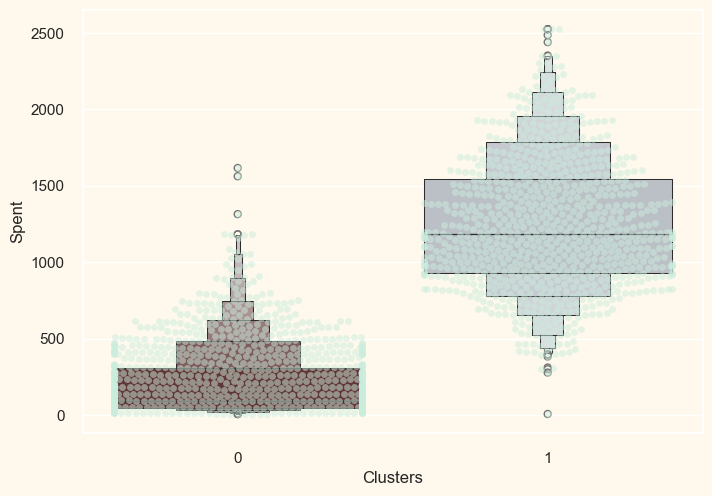

In [75]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"], palette=pal)
plt.show()

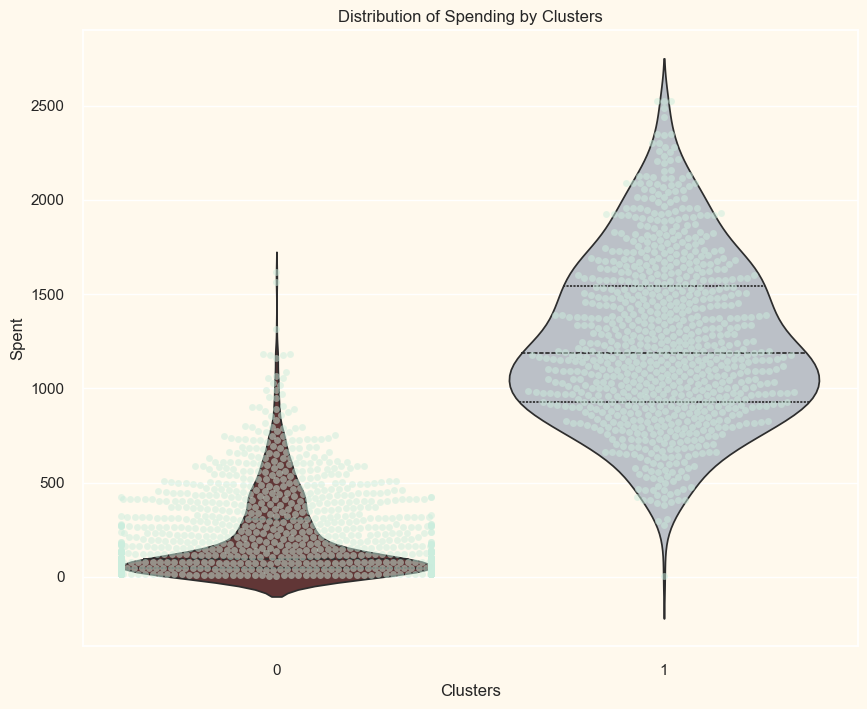

In [76]:
# visualizing using violin plot
plt.figure(figsize=(10,8))
pl = sns.violinplot(x=df["Clusters"], y=df["Spent"], palette=pal, inner="quartile")
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
plt.title("Distribution of Spending by Clusters")
plt.show()

In [107]:
df.columns

Index(['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines',
       'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Customer_For',
       'Age', 'Spent', 'Living_With', 'Children', 'Family_Size', 'Is_Parent',
       'Clusters', 'Total_Promos'],
      dtype='object')

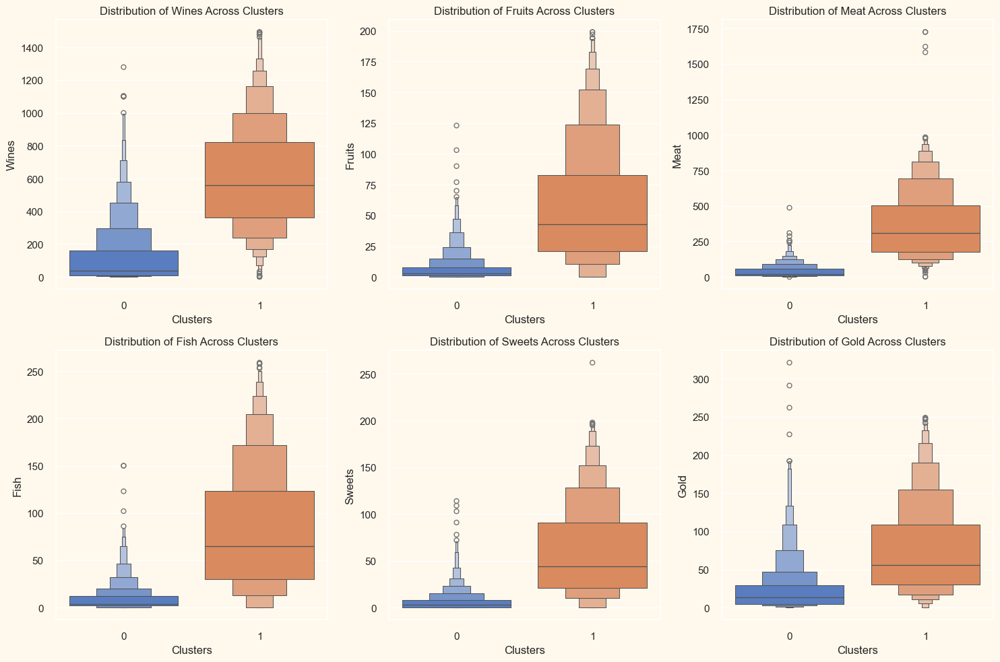

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns

products = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Set plot size
plt.figure(figsize=(15, 10))

# Loop through products and create boxen plots
for i, product in enumerate(products):
    plt.subplot(2, 3, i+1)
    sns.boxenplot(x=df["Clusters"], y=df[product], palette="muted")  # Fix: use df[product] instead of df[products]
    plt.title(f"Distribution of {product} Across Clusters")  # Fix: use singular product name

plt.tight_layout()
plt.show()


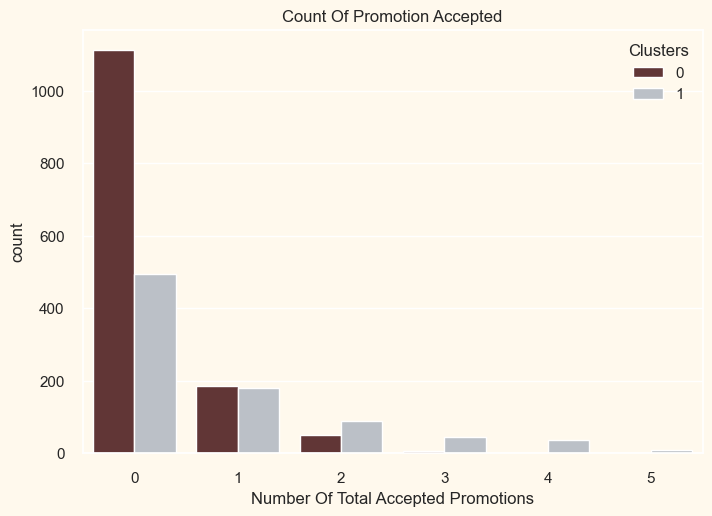

In [78]:
#Creating a feature to get a sum of accepted promotions 
df["Total_Promos"] = df["AcceptedCmp1"]+ df["AcceptedCmp2"]+ df["AcceptedCmp3"]+ df["AcceptedCmp4"]+ df["AcceptedCmp5"] + df["Response"]
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["Total_Promos"],hue=df["Clusters"], palette= pal)
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()


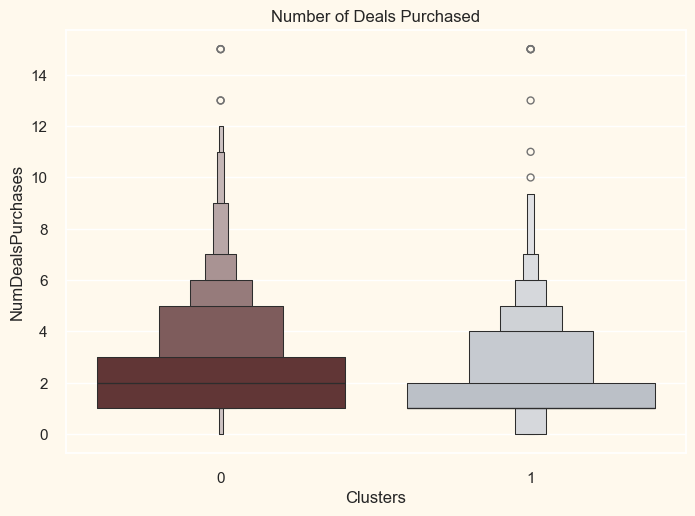

In [79]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"], palette= pal)
pl.set_title("Number of Deals Purchased")
plt.show()

<Figure size 800x550 with 0 Axes>

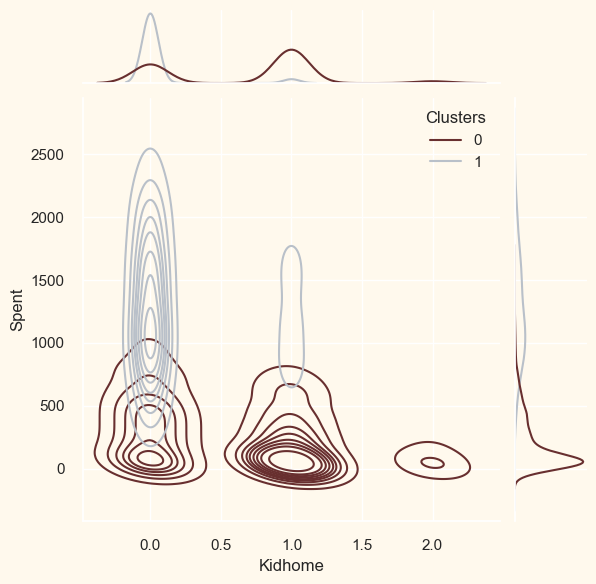

<Figure size 800x550 with 0 Axes>

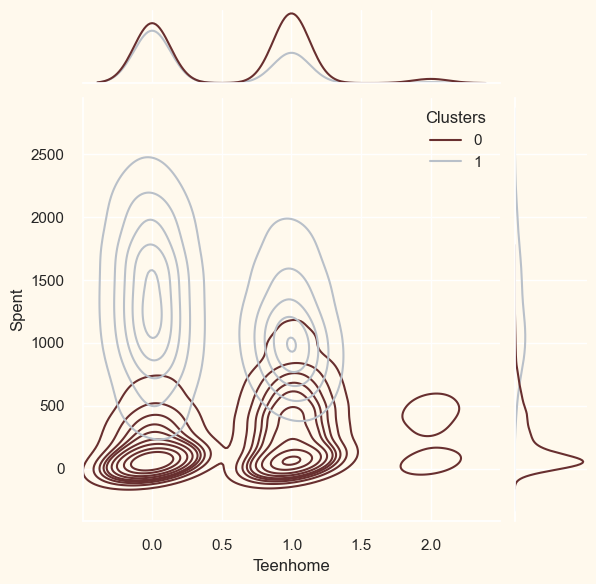

<Figure size 800x550 with 0 Axes>

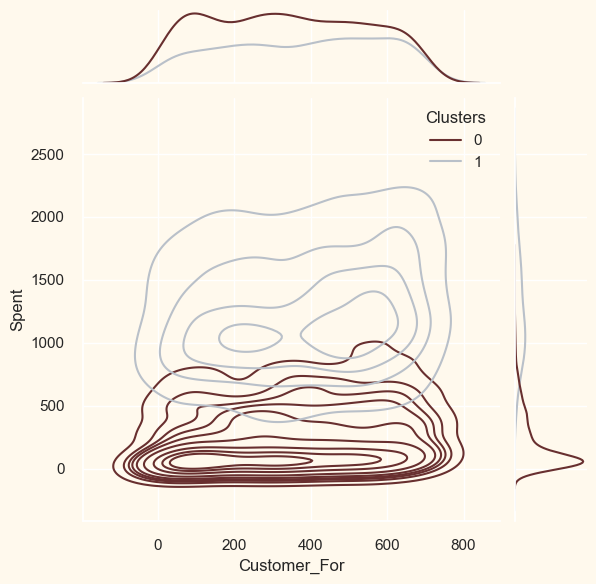

<Figure size 800x550 with 0 Axes>

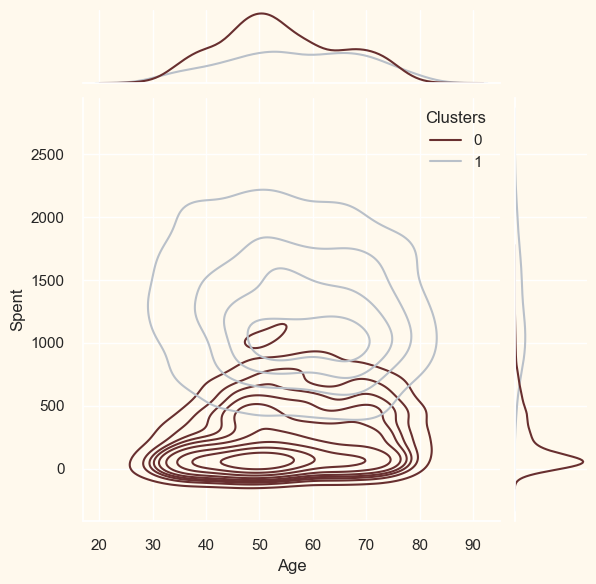

<Figure size 800x550 with 0 Axes>

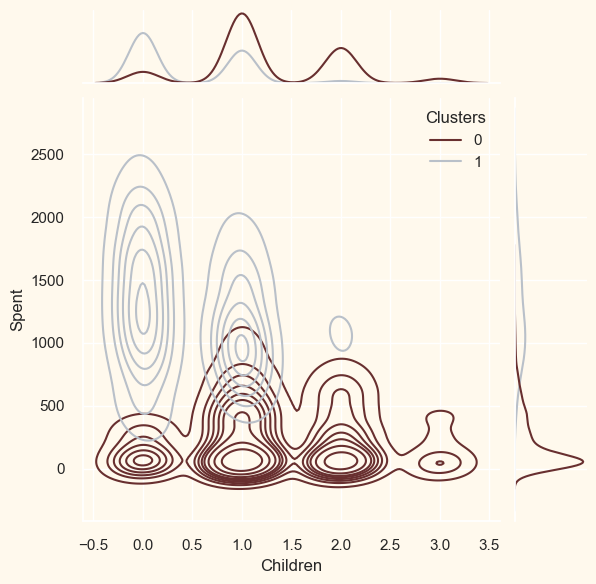

<Figure size 800x550 with 0 Axes>

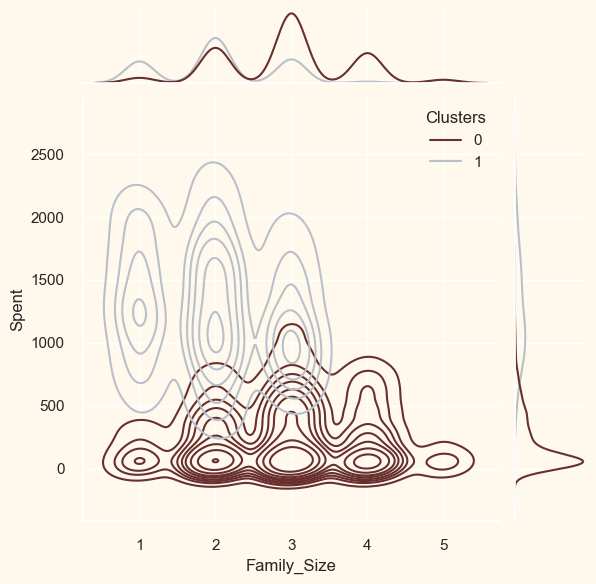

<Figure size 800x550 with 0 Axes>

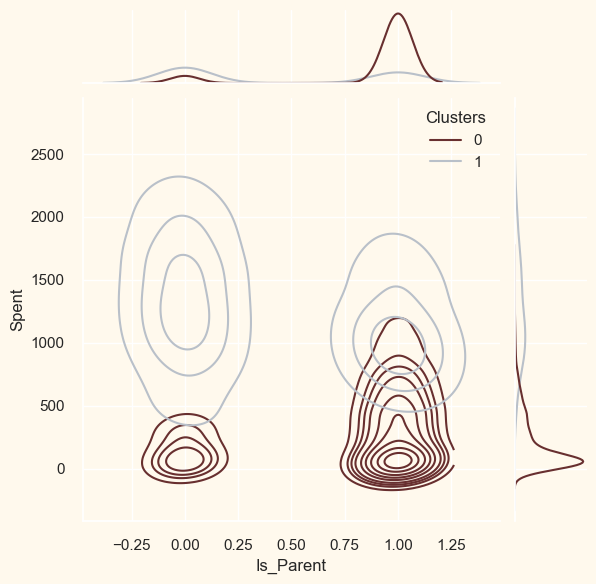

<Figure size 800x550 with 0 Axes>

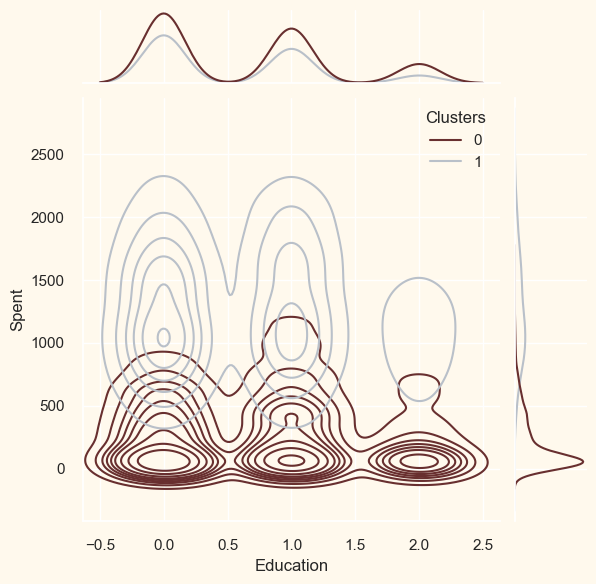

<Figure size 800x550 with 0 Axes>

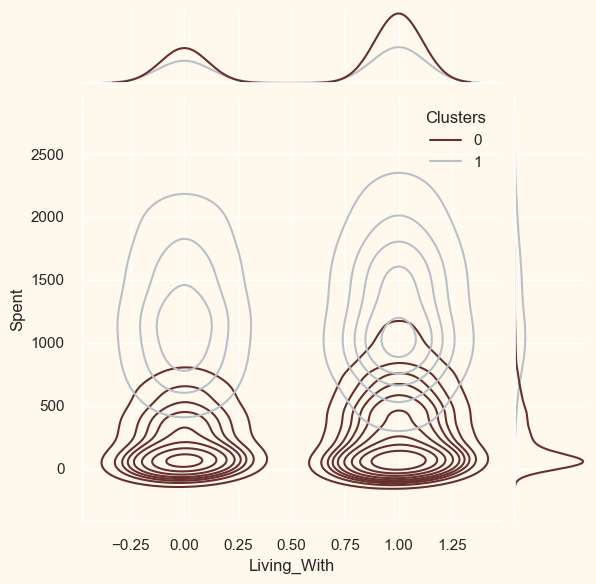

In [80]:
Personal = [ "Kidhome","Teenhome","Customer_For", "Age", "Children", "Family_Size", "Is_Parent", "Education","Living_With"]

for i in Personal:
    plt.figure()
    sns.jointplot(x=df[i], y=df["Spent"], hue =df["Clusters"], kind="kde", palette=pal)
    plt.show()